<a href="https://colab.research.google.com/github/saturnsz/pengolahancitradigial/blob/main/tugasweek6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

[]

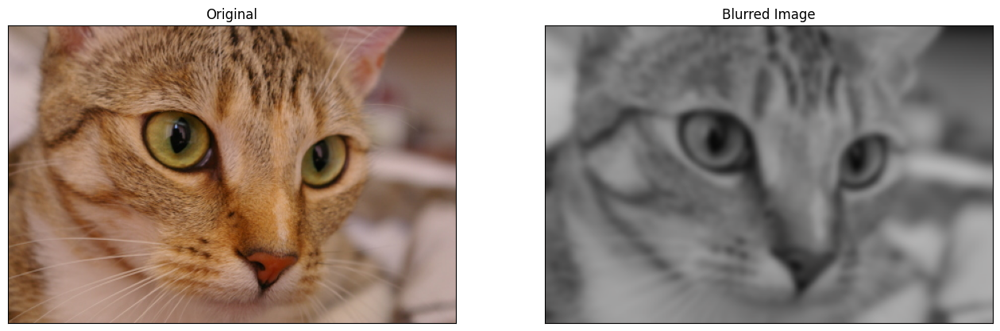

In [ ]:
from scipy import ndimage
from matplotlib import pyplot as plt
from skimage import data

face = data.chelsea()
blurred_face = ndimage.gaussian_filter(face, sigma=3)

fig, ax = plt.subplots(1, 2, figsize=(16,8))

ax[0].imshow(face)
ax[0].set_title('Original')
ax[0].set_xticks([])
ax[0].set_yticks([])

ax[1].imshow(blurred_face)
ax[1].set_title('Blurred Image')
ax[1].set_xticks([])
ax[1].set_yticks([])

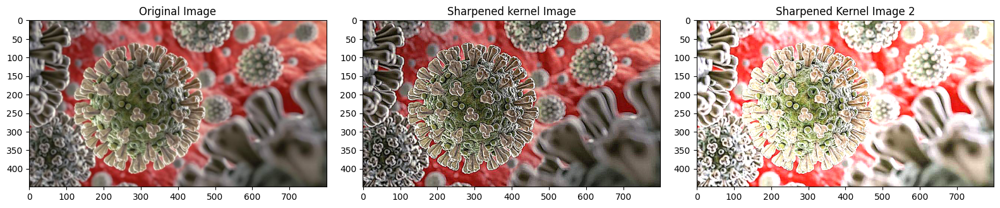

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

image = cv.imread('')

fig, ax = plt.subplots(1,3, figsize=(16,8))
fig.tight_layout()
# To conovolve the karnel on an image we can use cv.filter2d

ax[0].imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
ax[0].set_title('Original Image')

kernel_sharpening = np.array([[-1, -1, -1], [-1,9,-1], [-1,-1,-1]])
kernel_sharpening_2 = np.array([[-1, -1, -1], [-1,10,-1], [-1,-1,-1]])

sharpened = cv.filter2D(image, -1, kernel_sharpening)
ax[1].imshow(cv.cvtColor(sharpened, cv.COLOR_BGR2RGB))
ax[1].set_title('Sharpened kernel Image')

sharpened_2 = cv.filter2D(image, -1, kernel_sharpening_2)
ax[2].imshow(cv.cvtColor(sharpened_2, cv.COLOR_BGR2RGB))
ax[2].set_title('Sharpened Kernel Image 2')

plt.show()

In [ ]:
from PIL import Image
im = Image.open('/content/drive/MyDrive/907_1.jpg')
im.getbands()

('R', 'G', 'B')

In [ ]:
im.size

(800, 449)

In [ ]:
import base64
with open('/content/drive/MyDrive/907_1.jpg', 'rb') as image:
  image_string = image.read() # Read the image as binary data

In [ ]:
import io
image = io.BytesIO(image_string)

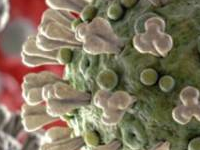

In [ ]:
im = Image.open('/content/drive/MyDrive/907_1.jpg')
box = (100, 150, 300, 300)
cropped_image = im.crop(box)
cropped_image

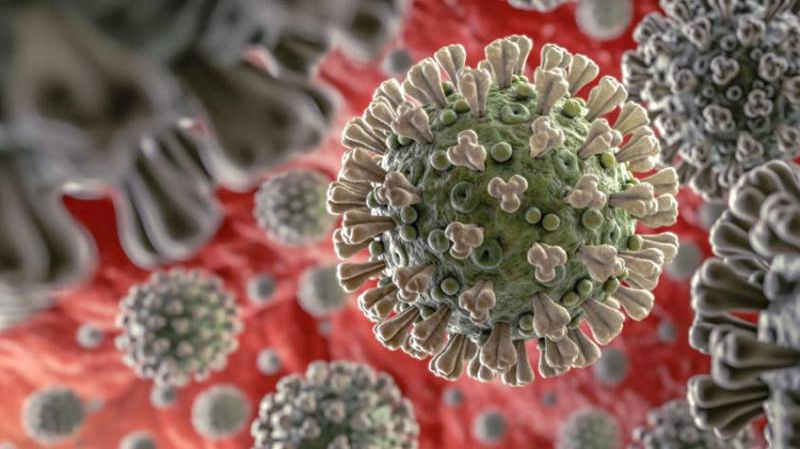

In [ ]:
rotated = im.rotate(180)
rotated

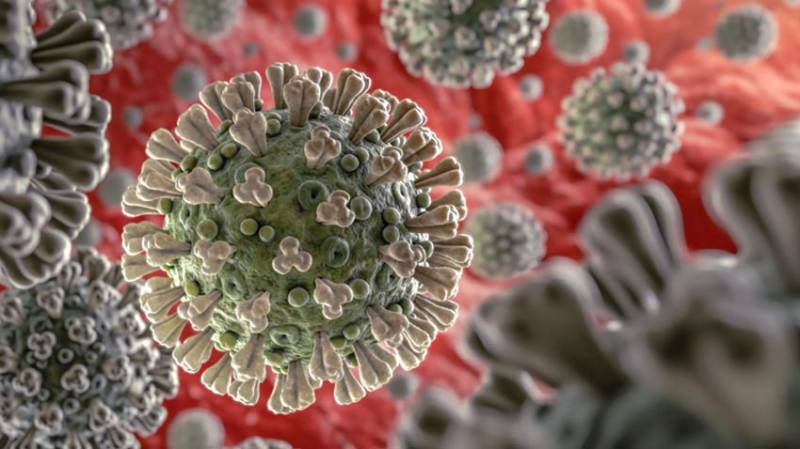

In [ ]:
logo = Image.open('/content/drive/MyDrive/907_1.jpg')
position = (50, 150)
im.paste(logo, position)
im.save('gambar.jpg')

im = image.open('/content/drive/MyDrive/907_1.jpg')
image_copy = im.copy()

position = ((image_copy.width - logo.width), (image_copy.height - logo.height))

image_copy.paste(logo, position)
image_copy

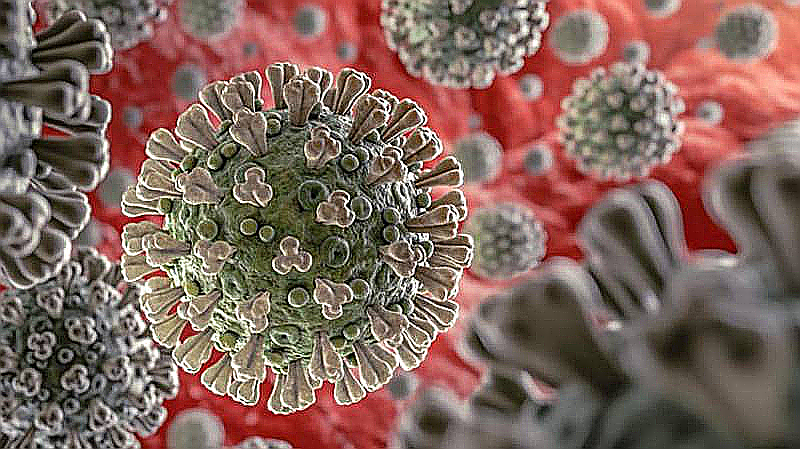

In [ ]:
from PIL import ImageEnhance

im = Image.open('/content/drive/MyDrive/907_1.jpg')
enhancer = ImageEnhance.Sharpness(im)
enhancer.enhance(10.0)

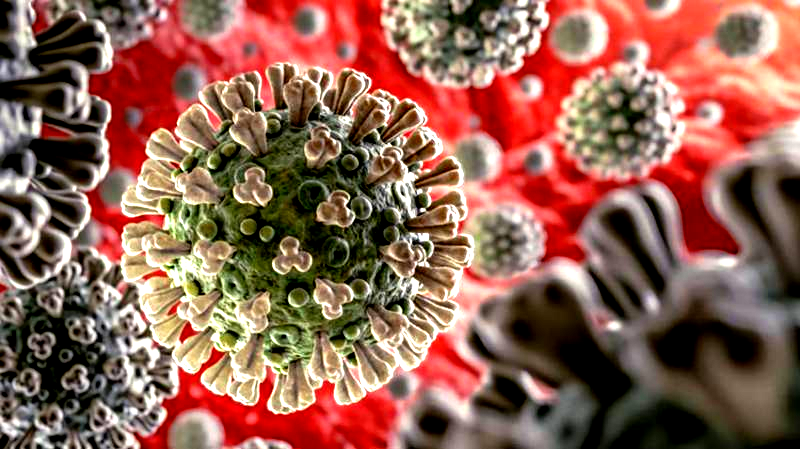

In [ ]:
enhancer = ImageEnhance.Contrast(im)
enhancer.enhance(2)

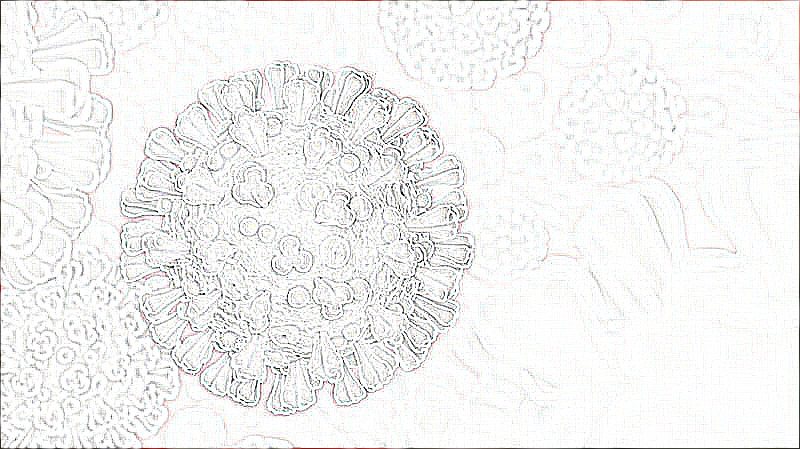

In [ ]:
from PIL import ImageFilter
im.filter(ImageFilter.CONTOUR)

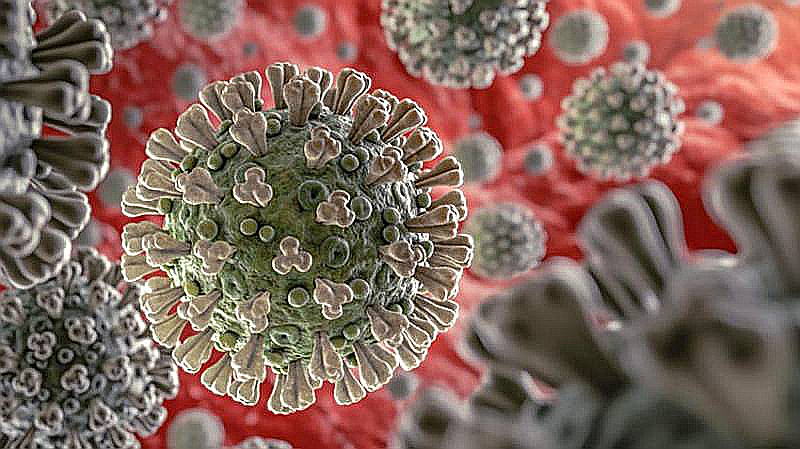

In [ ]:
im.filter(ImageFilter.EDGE_ENHANCE)

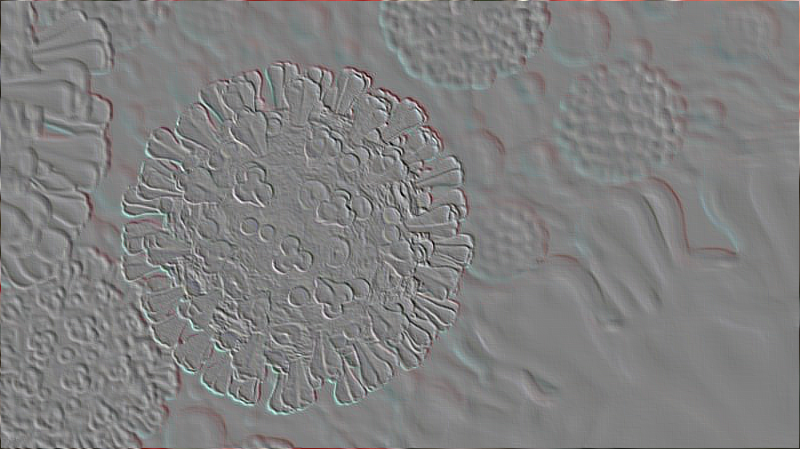

In [ ]:
im.filter(ImageFilter.EMBOSS)

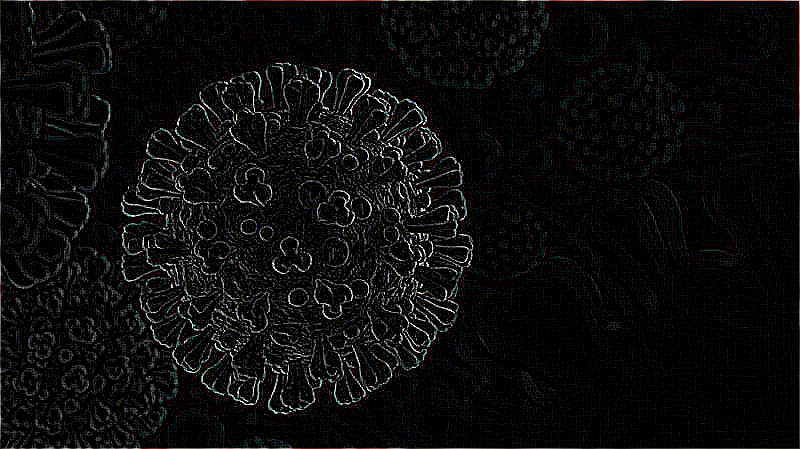

In [ ]:
im.filter(ImageFilter.FIND_EDGES)

In [ ]:
from PIL import Image, ImageSequence
import io

# Open the image using Image.open()
im = Image.open('/content/drive/MyDrive/907_1.jpg')

frame_num = 1
for frame in ImageSequence.Iterator(im):
  frame.save('frame%d.png' % frame_num)
  frame_num = frame_num + 1
  if frame_num > 3:
    break

In [ ]:
pip install mahotas

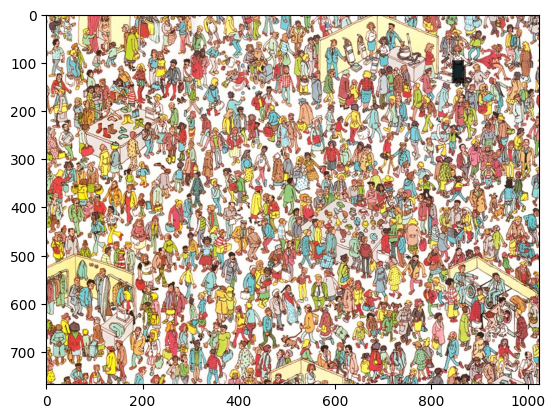

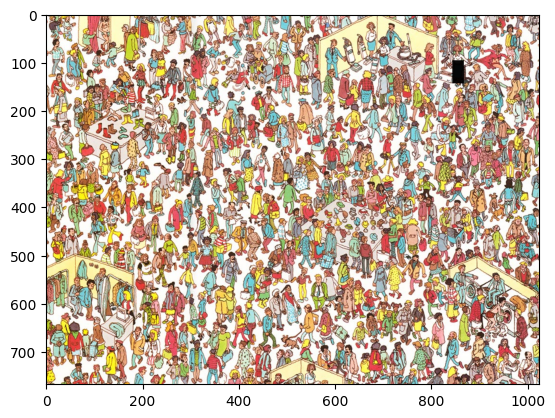

In [ ]:
from pylab import imshow, show
import mahotas as mh
import mahotas.demos
import numpy as np

wally = mahotas.demos.load('wally')
wfloat = wally.astype(float)

r,g,b = wfloat.transpose((2,0,1))
w = wfloat.mean(2)
# Use np.zeros to create an array initialized with zeros
pattern = np.zeros((24,16), float)

for i in range(2):
  pattern[i::4] = -1
  v = mahotas.convolve(r-w, pattern)
  mask = (v == v.max())
  mask = mahotas.dilate(mask, np.ones((48,24)))
  # Corrected the syntax error by removing the extra asterisk
  np.subtract(wally, .8*wally * mask[:,:,None],
              out=wally, casting='unsafe')
  imshow(wally)
  show()

Text(0.5, 1.0, 'citra frekuensi rendah')

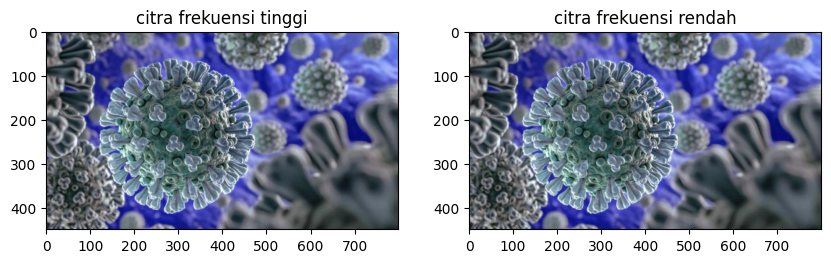

In [2]:
import cv2
import matplotlib.pyplot as plt

img_high = cv2.imread('/content/drive/MyDrive/907_1.jpg')
img_low = cv2.imread('/content/drive/MyDrive/907_1.jpg')

# tampil citra asli
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(img_high, cmap='gray')
plt.title('citra frekuensi tinggi')

plt.subplot(1,2,2)
plt.imshow(img_low, cmap='gray')
plt.title('citra frekuensi rendah')

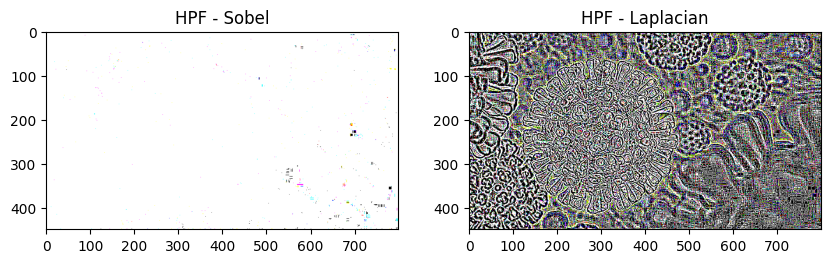

In [3]:
# Sobel Filter (deteksi tepi arah x dan y)
sobel_x = cv2.Sobel(img_high, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(img_high, cv2.CV_64F, 0, 1, ksize=3)
sobel_combined = cv2.magnitude(sobel_x, sobel_y)

# Laplacian Filter
laplacian = cv2.Laplacian(img_high, cv2.CV_64F)

plt.figure(figsize=(10,4))
plt.subplot(1,2,1); plt.imshow(sobel_combined, cmap='gray'); plt.title('HPF - Sobel')
plt.subplot(1,2,2); plt.imshow(laplacian, cmap='gray'); plt.title('HPF - Laplacian')
plt.show()


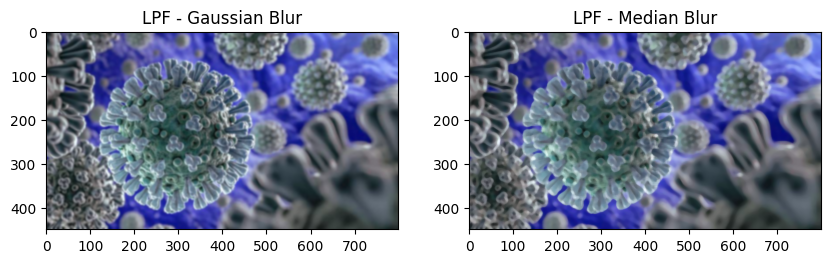

In [4]:
# Gaussian Blur
gaussian = cv2.GaussianBlur(img_low, (7,7), 0)

# Median Blur
median = cv2.medianBlur(img_low, 7)

plt.figure(figsize=(10,4))
plt.subplot(1,2,1); plt.imshow(gaussian, cmap='gray'); plt.title('LPF - Gaussian Blur')
plt.subplot(1,2,2); plt.imshow(median, cmap='gray'); plt.title('LPF - Median Blur')
plt.show()


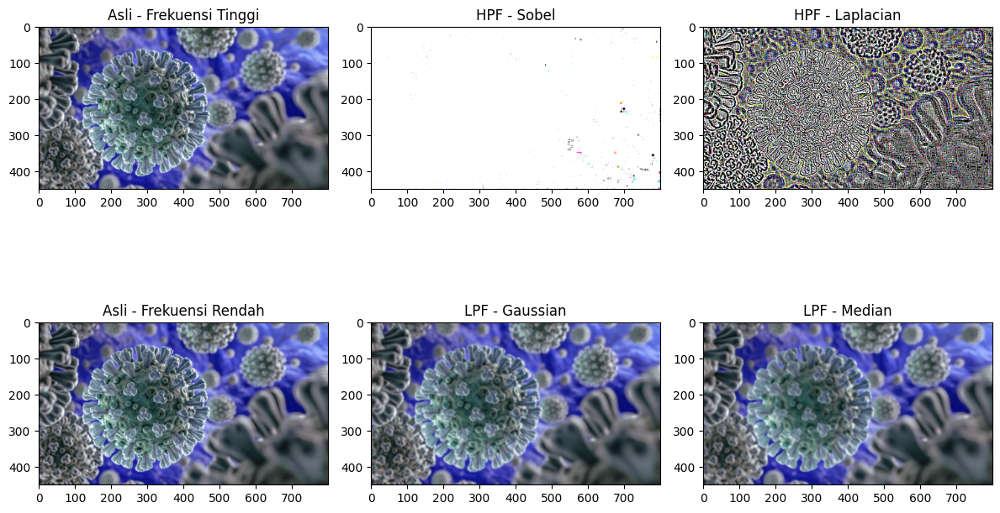

In [5]:
plt.figure(figsize=(12,8))

plt.subplot(2,3,1); plt.imshow(img_high, cmap='gray'); plt.title('Asli - Frekuensi Tinggi')
plt.subplot(2,3,2); plt.imshow(sobel_combined, cmap='gray'); plt.title('HPF - Sobel')
plt.subplot(2,3,3); plt.imshow(laplacian, cmap='gray'); plt.title('HPF - Laplacian')

plt.subplot(2,3,4); plt.imshow(img_low, cmap='gray'); plt.title('Asli - Frekuensi Rendah')
plt.subplot(2,3,5); plt.imshow(gaussian, cmap='gray'); plt.title('LPF - Gaussian')
plt.subplot(2,3,6); plt.imshow(median, cmap='gray'); plt.title('LPF - Median')

plt.tight_layout()
plt.show()
